### TTV analysis assuming Student's t likelihood

This notebook reproduces the TTV analysis of the TRAPPIST-1 system presented in [Agol et al. (2021)](https://iopscience.iop.org/article/10.3847/PSJ/abd022). The entire notebook ran in ~11hr using [jnkepler](https://github.com/kemasuda/jnkepler) 0.2.4 and JAX 0.6.2 on an Apple M3 Ultra.

**Convergence note**: As shown in the summary statistics printed by `mcmc.print_summary()`, most parameters mix well, while some still show $\hat{R}\gtrsim 1.05$, so longer runs would be needed for full convergence. 
Here we keep the runs short for demonstration purposes. The results are already in good agreement with the published analysis, as shown in the corner plot at the bottom of this notebook.

In [1]:
import jax, os
jax_version = jax.__version__
major, minor, patch = (int(x) for x in jax_version.split(".")[:3])
if (major, minor, patch) >= (0, 4, 32):
    print(f"JAX version: {jax_version}")
    os.environ["XLA_FLAGS"] = "--xla_cpu_use_thunk_runtime=false"
import jnkepler
print(f"jnkepler version: {jnkepler.__version__}")
import numpy as np
import jax.numpy as jnp
import matplotlib.pyplot as plt
import pandas as pd
from jax import config, random
import numpyro, jax
import numpyro.distributions as dist
from numpyro.infer import MCMC, NUTS, init_to_value
config.update('jax_enable_x64', True)
numpyro.set_platform('cpu')
num_chains = 4
numpyro.set_host_device_count(num_chains)
print ('# jax device count:', jax.local_device_count())

JAX version: 0.6.2
jnkepler version: 0.2.3.post1.dev22
# jax device count: 4


In [2]:
from jnkepler.jaxttv import JaxTTV
from jnkepler.jaxttv.infer import ttv_default_parameter_bounds, ttv_optim_curve_fit
from jnkepler.information import information_from_model_independent_normal
import arviz as az
import corner

In [3]:
import seaborn as sns
sns.set(style='ticks', font_scale=1.6, font='times')
plt.rcParams["figure.figsize"] = (12,6)
from matplotlib import rc
rc('text', usetex=False)

### Load timing data

In [4]:
d = pd.read_csv("T1_timings_20191203.txt", header=None, names=['planum', 'tnum', 'tc', 'tcerr'])

tcobs = [jnp.array(d.tc[d.planum==j+1]) for j in range(7)]
errorobs = [jnp.array(d.tcerr[d.planum==j+1]) for j in range(7)]
tnums = [jnp.array(d.tnum[d.planum==j+1]) for j in range(7)]

p_init = []
for j in range(7):
    p_, t0_ = np.polyfit(tnums[j], tcobs[j], deg=1)
    p_init.append(p_)
p_init = jnp.array(p_init)

dt, t_start = 0.06, 7257.93115525 # Agol paper
t_end = 8790.
jttv = JaxTTV(t_start, t_end, dt, tcobs, p_init, errorobs=errorobs, print_info=True)

# number of transiting planets:    7
# integration starts at:           7257.93
# first transit time in data:      7282.81
# last transit time in data:       8785.39
# integration ends at:             8790.00
# integration time step:           0.0600 (1/25 of innermost period)



### Initial optimization

In [5]:
param_bounds = ttv_default_parameter_bounds(jttv)

/Users/k_masuda/miniforge3/envs/thunkrt/lib/python3.12/site-packages/jnkepler/jaxttv/infer.py:142: UserWarning: Bounds for cosi/lnode not provided: assuming coplanar orbits.
  warnings.warn(


# running least squares optimization (n_start=1)...
#   start 0: objective=3084308.93 --> 654.34, elapsed=113.0 s
# ------------------------------------------------------------
# best objective over all starts: 654.34 (447 data)
# total elapsed time: 113.1 sec
# ------------------------------------------------------------


/Users/k_masuda/miniforge3/envs/thunkrt/lib/python3.12/site-packages/jnkepler/jaxttv/jaxttv.py:531: UserWarning: using t0 and P from a linear fit to the observed transit times.
  warnings.warn(


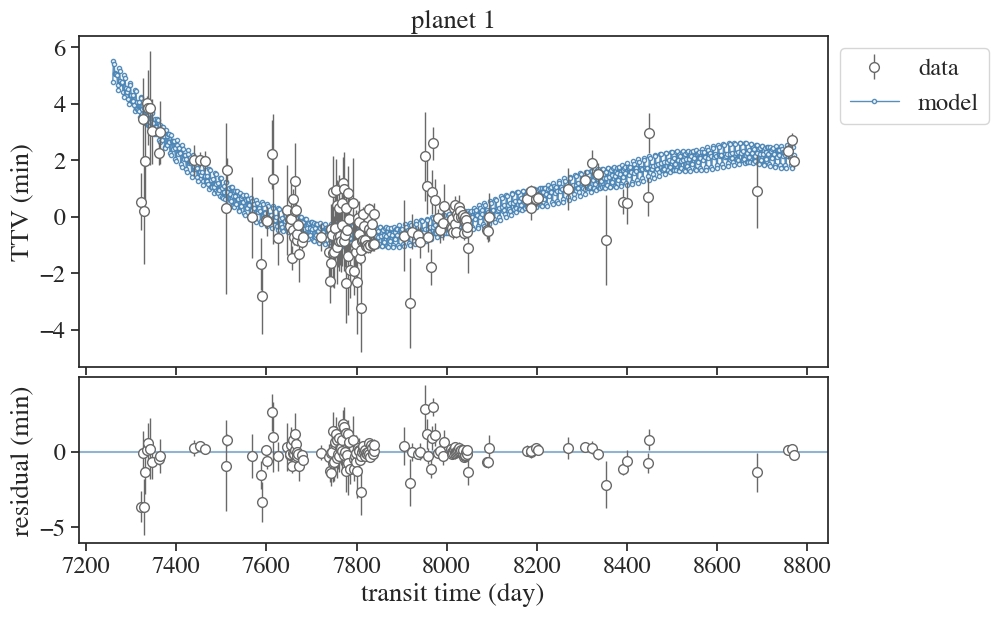

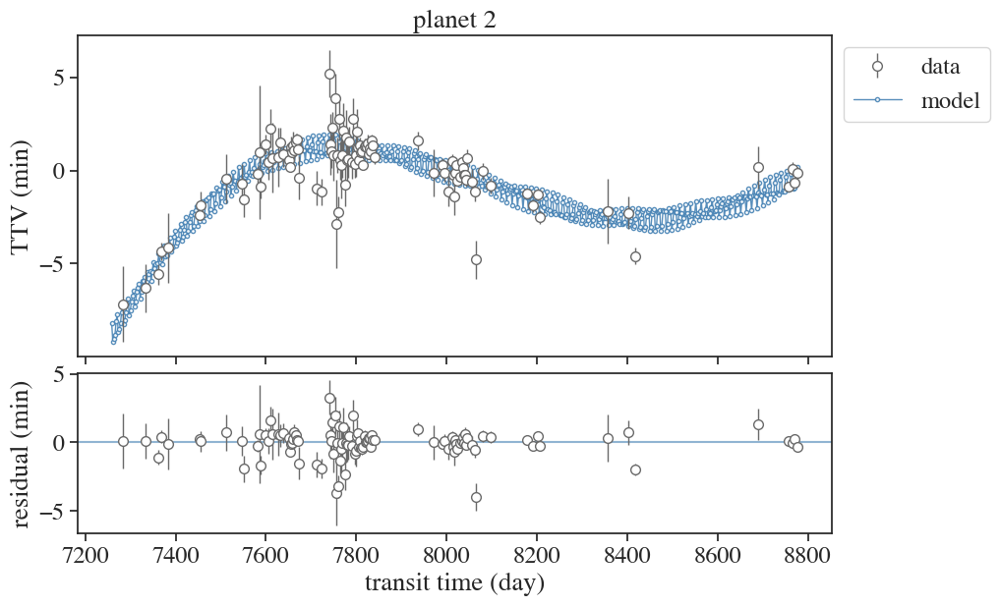

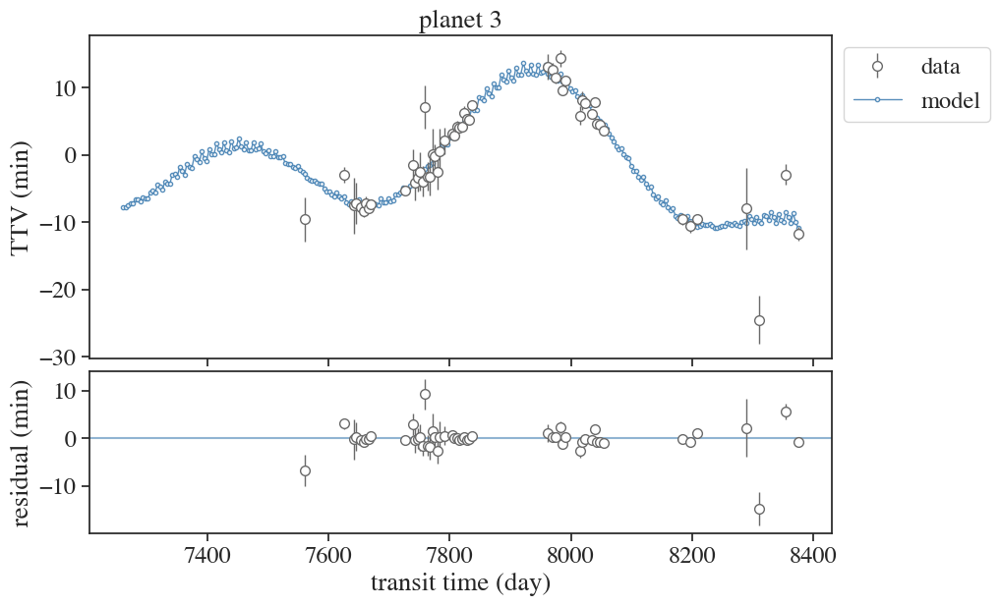

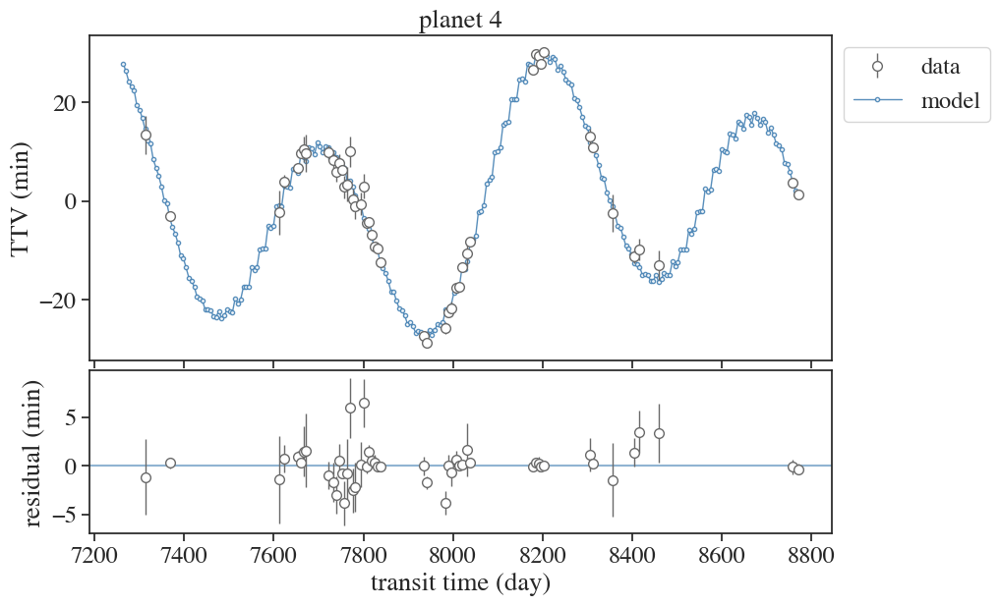

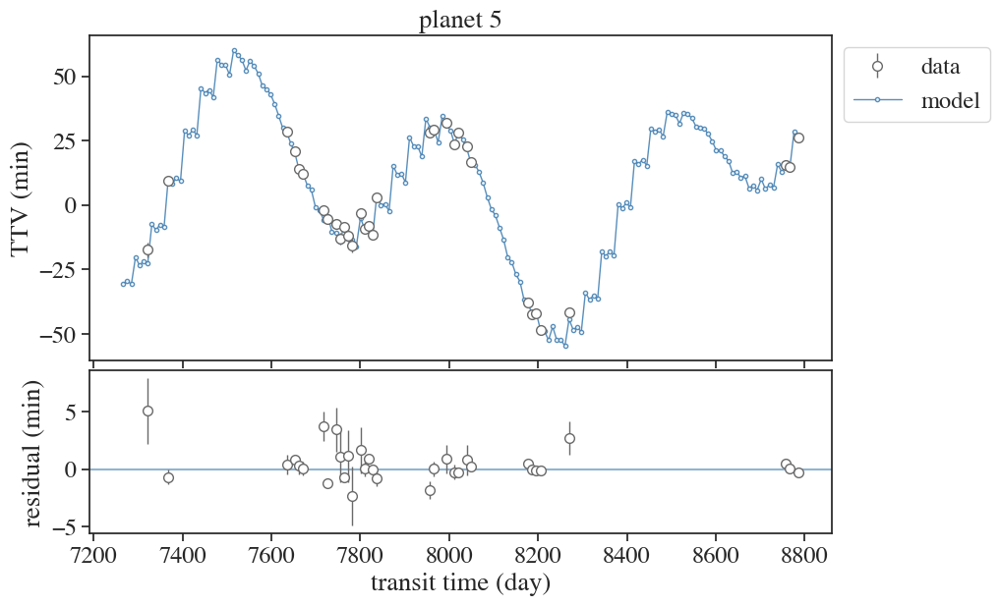

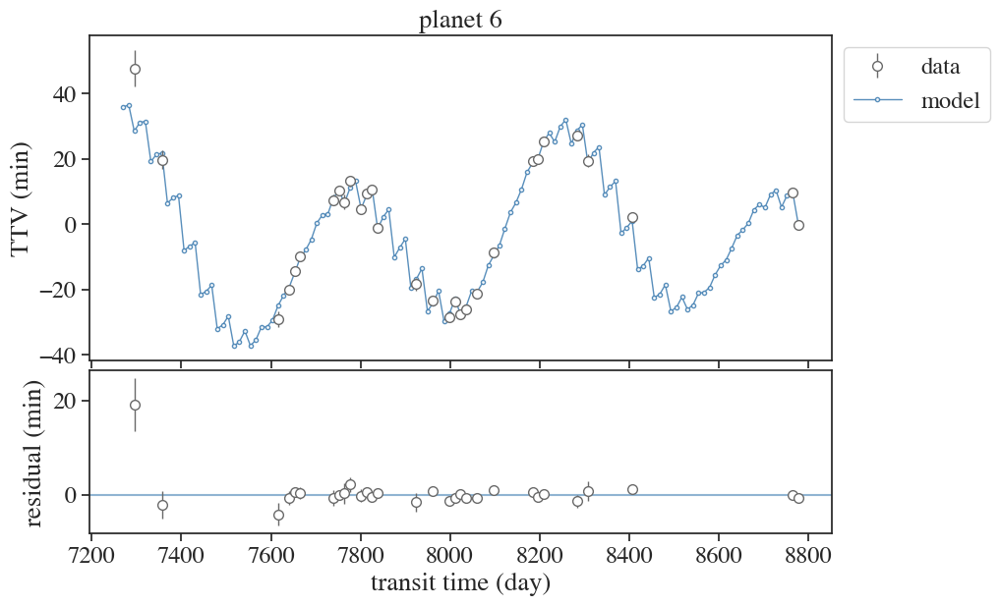

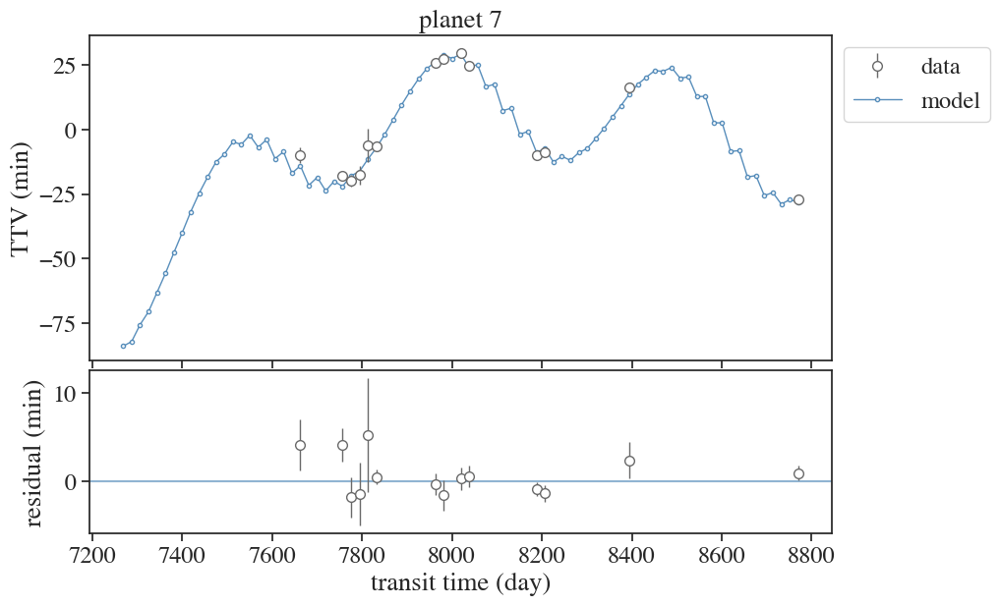

In [6]:
popt = ttv_optim_curve_fit(jttv, param_bounds)

sample: 100%|██████████| 1000/1000 [00:00<00:00, 1208.38it/s, 7 steps of size 5.72e-01. acc. prob=0.89]



                mean       std    median      5.0%     95.0%     n_eff     r_hat
      lndf      1.64      0.27      1.62      1.21      2.07    193.25      1.01
     lnvar     -0.10      0.12     -0.09     -0.30      0.09    160.25      1.01

Number of divergences: 0


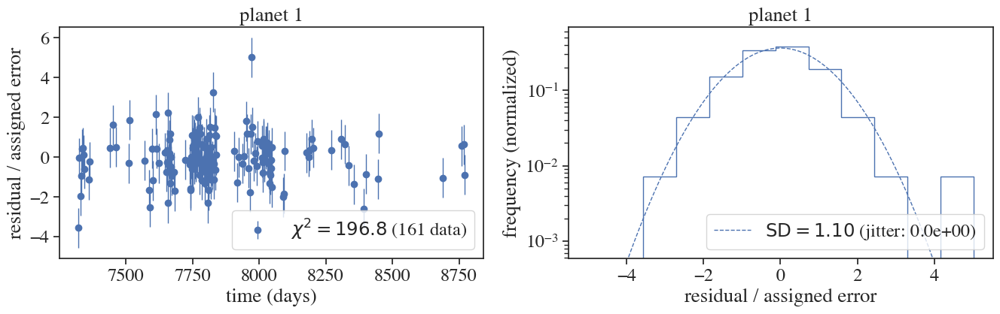

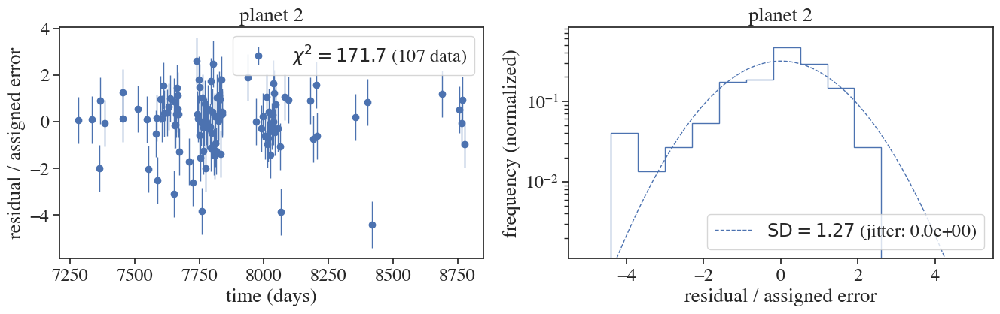

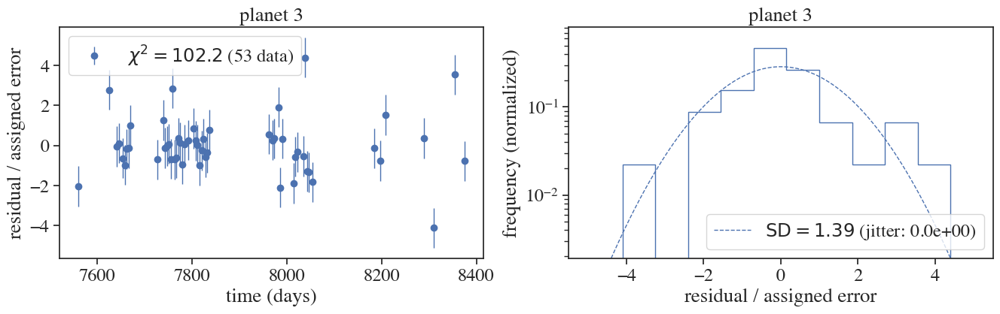

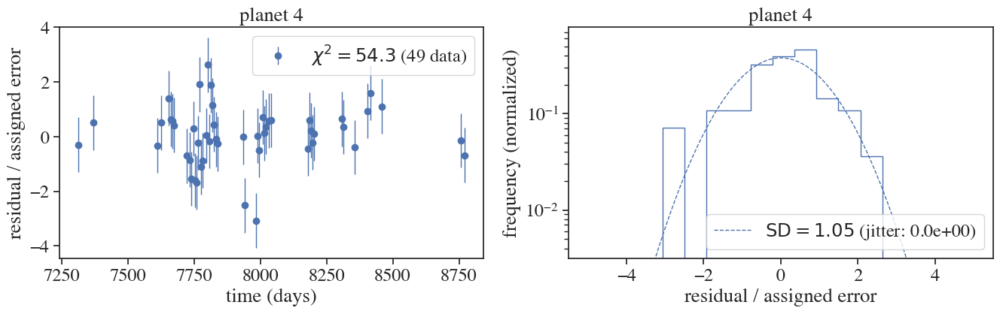

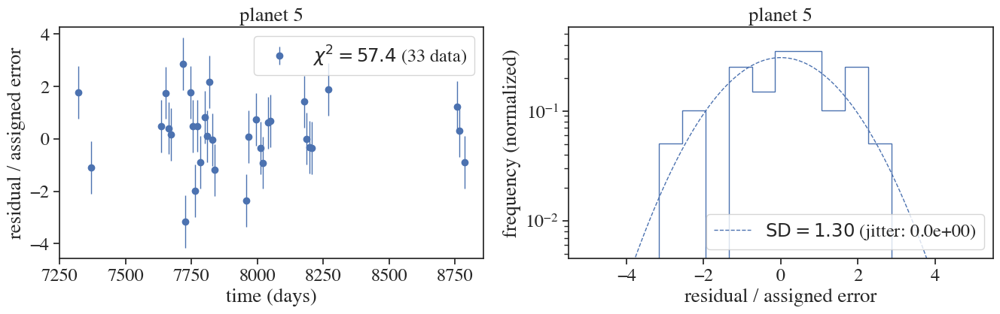

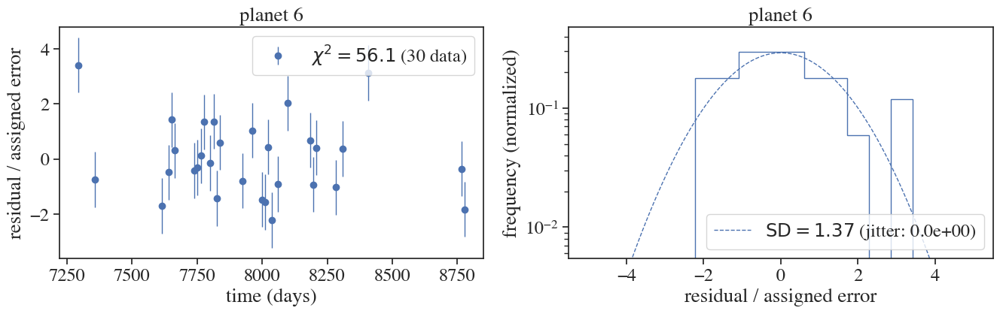

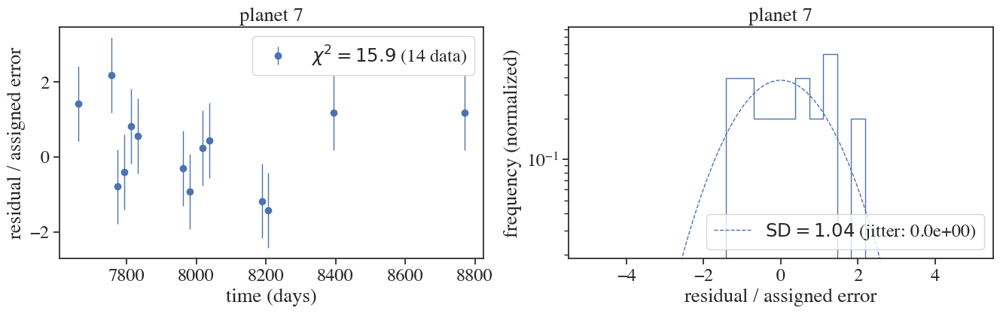

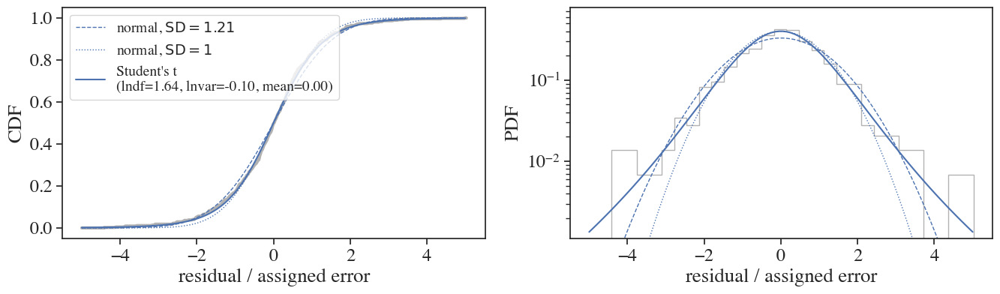

In [7]:
pdic_normal, pdic_student = jttv.check_residuals(popt)

### Running NUTS

In [8]:
def model_student(sample_keys, param_bounds, uniform_ecc=True, eps=1e-4, df_min=0.5, df_max=100., var_min=0.1, var_max=10.):
    """numpyro model for scaled parameters"""
    par = {}

    # sample parameters from priors
    for key in sample_keys:
        par[key] = numpyro.sample(key, dist.Uniform(param_bounds[key][0], param_bounds[key][1]))
    if "pmass" not in sample_keys:
        par["pmass"] = numpyro.deterministic("pmass", jnp.exp(par["lnpmass"]))
    
    # Jacobian for uniform ecc prior
    # eps is introduced to prevent the log singularity at e=0; a smaller value can be used if needed
    if uniform_ecc:
        ecc = numpyro.deterministic("ecc", jnp.sqrt(par['ecosw']**2 + par['esinw']**2))
        numpyro.factor("eprior", -jnp.log(ecc + eps))

    # compute transit times
    tcmodel, ediff = jttv.get_transit_times_obs(par)
    numpyro.deterministic("ediff", ediff)
    numpyro.deterministic("tcmodel", tcmodel)
    normres = numpyro.deterministic("normres", (jttv.tcobs_flatten - tcmodel) / jttv.errorobs_flatten)
    
    # StudentT likelihood
    lndf = numpyro.sample("lndf", dist.Uniform(jnp.log(df_min), jnp.log(df_max)))
    lnvar = numpyro.sample("lnvar", dist.Uniform(jnp.log(var_min), jnp.log(var_max)))
    df = numpyro.deterministic("df", jnp.exp(lndf))
    v1 = numpyro.deterministic("v1", jnp.exp(lnvar))
    numpyro.sample("obs", dist.StudentT(scale=jnp.sqrt(v1), df=df), obs=normres)

In [9]:
# physical parameters to sample from
sample_keys = ["ecosw", "esinw", "pmass", "period", "tic"]

In [10]:
info = information_from_model_independent_normal(model=model_student, model_args=(sample_keys, param_bounds), keys=sample_keys, param_space="unconstrained",
                                                 pdic=popt, mu_name='tcmodel', observed=jttv.tcobs_flatten, sigma_sd=jttv.errorobs_flatten)

In [11]:
dense_mass = [tuple(sample_keys)] + [tuple(['lndf', 'lnvar'])]
parameter_cov_unconstrained = jnp.linalg.inv(info['fisher'])
inverse_mass_matrix = {dense_mass[0]: parameter_cov_unconstrained, dense_mass[1]: jnp.diag(jnp.array([pdic_student['lndf_scale']**2, pdic_student['lnvar_scale']**2]))}

In [12]:
popt['lndf'] = pdic_student['lndf_loc']
popt['lnvar'] = pdic_student['lnvar_loc']

In [13]:
kernel = NUTS(model_student, 
            init_strategy=init_to_value(values=popt), 
            dense_mass=dense_mass,
            inverse_mass_matrix=inverse_mass_matrix,
            max_tree_depth=10, # increase if num_steps keep hitting 2**max_tree_depth - 1
            target_accept_prob=0.8, # increase if there are many divergences
            regularize_mass_matrix=True, # set True if there are many divergences or if sampling breaks
            adapt_mass_matrix=False,
            )

In [14]:
mcmc = MCMC(kernel, num_warmup=1000, num_samples=1000, num_chains=num_chains)

In [ ]:
# 10.5hr
rng_key = random.PRNGKey(0)
mcmc.run(rng_key, sample_keys, param_bounds, extra_fields=('potential_energy', 'num_steps', 'adapt_state'))

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

In [16]:
mcmc.print_summary()


                mean       std    median      5.0%     95.0%     n_eff     r_hat
  ecosw[0]      0.00      0.00      0.00     -0.00      0.01    157.92      1.04
  ecosw[1]     -0.00      0.00     -0.00     -0.00      0.00    265.54      1.03
  ecosw[2]      0.00      0.00      0.00      0.00      0.01    344.95      1.03
  ecosw[3]     -0.00      0.00     -0.00     -0.01     -0.00    316.12      1.03
  ecosw[4]      0.01      0.00      0.01      0.01      0.01    361.97      1.03
  ecosw[5]     -0.00      0.00     -0.00     -0.01     -0.00    359.76      1.03
  ecosw[6]      0.00      0.00      0.00      0.00      0.00    602.58      1.02
  esinw[0]     -0.00      0.00     -0.00     -0.01      0.00   1180.41      1.01
  esinw[1]      0.00      0.00      0.00     -0.00      0.00   1204.08      1.01
  esinw[2]     -0.00      0.00     -0.00     -0.00     -0.00   1767.03      1.00
  esinw[3]      0.00      0.00      0.00      0.00      0.01   1967.07      1.00
  esinw[4]      0.00      0

In [17]:
idata = az.from_numpyro(mcmc)
idata.to_json("trappist-1.json")

'trappist-1.json'

### Trace plots

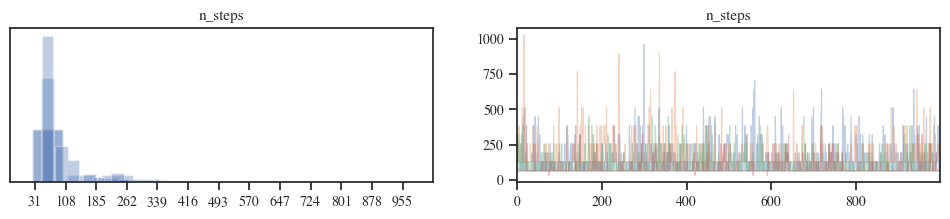

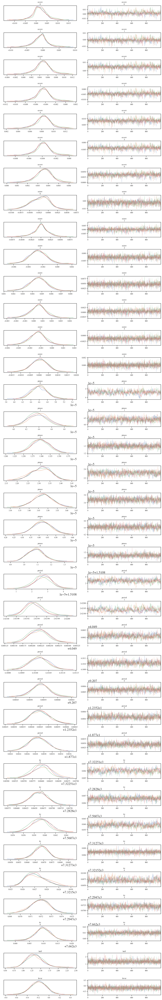

In [18]:
az.plot_trace(idata.sample_stats, var_names=['n_steps'], compact=False)

az.rcParams['plot.max_subplots'] = 200
fig = az.plot_trace(idata, var_names=sample_keys+['lndf', 'lnvar'], compact=False)
plt.tight_layout(pad=0.2)

### Comparison with [Agol et al. (2021)](https://iopscience.iop.org/article/10.3847/PSJ/abd022)

In [34]:
idata.posterior['mu'] = idata.posterior['pmass'] / 3.003e-6 # Earth mass

# reparameterization in Agol+2021
v1 = np.exp(idata.posterior['lnvar'])
nu = np.exp(idata.posterior['lndf'])
idata.posterior['vnurep'] = v1 * np.exp(1./2/nu)

In [ ]:
idata_a21 = az.from_json("T1_agol2021_thin30.json")

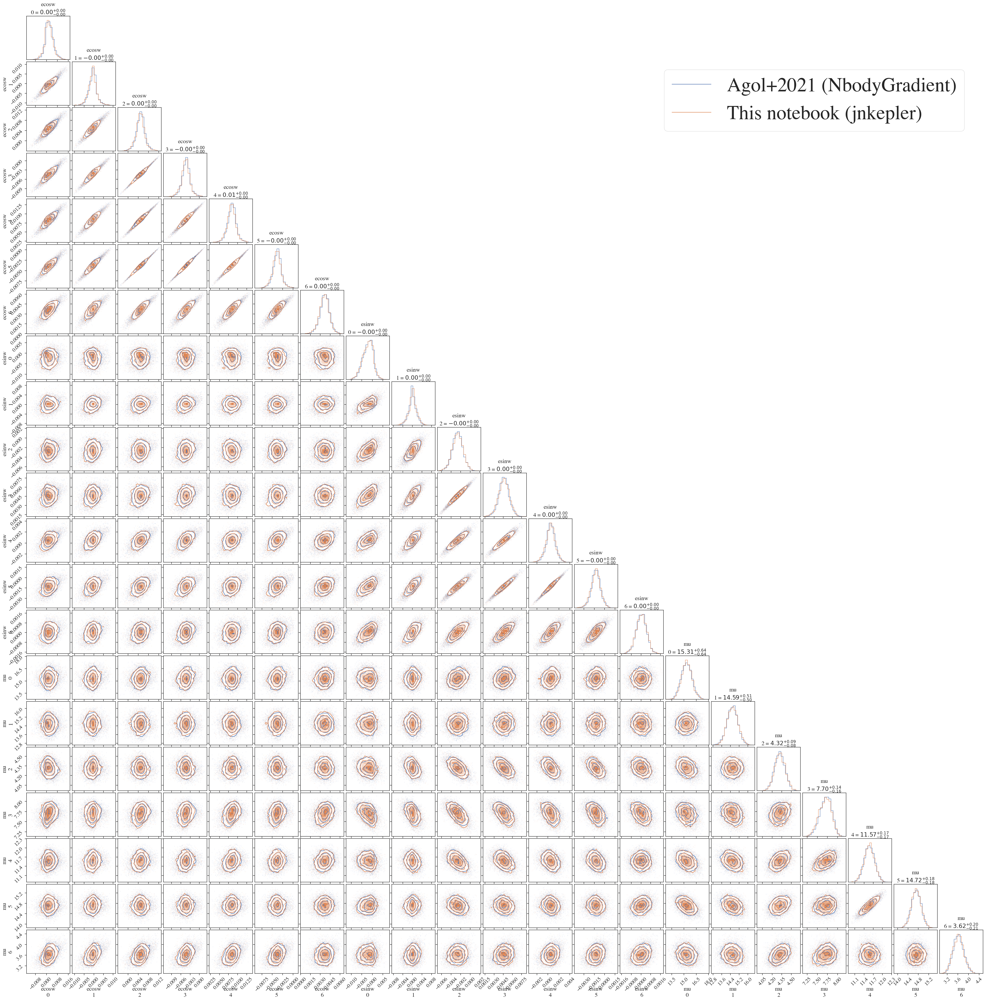

In [48]:
import matplotlib.lines as mlines

#names = ["ecosw", "esinw", "mu", "period"] + ['lndf', 'vnurep']
names = ['ecosw', 'esinw', 'mu'] # plot selected parameters to keep size reasonable
fig_ = corner.corner(idata_a21, var_names=names, show_titles=True, color='C0', hist_kwargs={'density': True}, bins=20)
fig = corner.corner(idata, var_names=names, show_titles=True, color='C1', hist_kwargs={'density': True}, bins=20, fig=fig_)

names = ['Agol+2021 (NbodyGradient)', 'This notebook (jnkepler)']
#ndim = 7 * 4 + 2
ndim = 7 * 3
handles = []
for i, name in enumerate(names):
    handles.append(mlines.Line2D([], [], color='C%d'%i, label=name))
plt.legend(handles=handles, bbox_to_anchor=(0.8, ndim), fontsize=65);